In [190]:
import s3fs
s3 = s3fs.S3FileSystem(anon=False)
import xarray as xr
import rioxarray as rio
import pandas as pd
import geopandas as gpd
from matplotlib import pyplot as plt
import glob
import numpy as np

## Looking at the Relationship Between Weather and Fire Spread

Fire risk is determined by a combination of weather, climate and fuel conditions. One metric for determining fire risk is the Fire Weather Index (FWI), an index that is used in Alaska and internationally. FWI is a combination of many sub-metrics that look at different aspects of fire risk like fuel moisture, dryness, and wind. FWI helps scientists anticipate when fire will ignight or spread rapidly. 

To visualize how FWI relates to fire spread, we will look at the timeline of the [Beachie Creek](https://www.fs.usda.gov/detailfull/willamette/fire/?cid=fseprd835368&width=full)/ [Lionshead fire](https://www.fs.usda.gov/detailfull/willamette/fire/?cid=fseprd835648&width=full), that burned in the late summer of 2020. 

We can load up the perimeters of the fire line through time. 




In [191]:
## Load in the perimeters of the fires
lf_files = s3.glob('s3://veda-data-store-staging/EIS/other/feds-WesternUS/2020/Largefire/F' + '5119' + '_*') 
fire = gpd.read_file("s3://" + lf_files[-1],layer='perimeter')
fire = fire.to_crs('EPSG:4326')
fire.t = fire.t.astype("str")
fire.explore(color = "purple", style_kwds={'fillOpacity': 0})

/opt/conda/lib/python3.7/site-packages/geopandas/geodataframe.py:600: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


To look at the FWI before and during the fire, we will load up a gridded FWI data. The gridded FWI data is based on combining precipitation data from the multi-sattelite fusion dataset IMERG, and the climate model GEOS-5.

In [192]:
imerge_hourly = xr.open_dataset("s3://veda-data-store-staging/EIS/zarr/FWI-GEOS-5-Hourly", engine="zarr")
imerge_hourly.rio.write_crs("epsg:4326", inplace=True)
imerge_hourly.rio.set_spatial_dims(x_dim = "lon", y_dim = "lat", inplace = True)
imerge_hourly

<xarray.Dataset>
Dimensions:      (time: 26880, lat: 533, lon: 1152)
Coordinates:
  * lat          (lat) float64 -58.0 -57.75 -57.5 -57.25 ... 74.5 74.75 75.0
  * lon          (lon) float64 -180.0 -179.7 -179.4 -179.1 ... 179.1 179.4 179.7
  * time         (time) datetime64[ns] 2020-01-01 ... 2023-01-24T23:00:00
    spatial_ref  int64 0
Data variables:
    GEOS-5_FFMC  (time, lat, lon) float32 ...
    GEOS-5_FWI   (time, lat, lon) float32 ...
    GEOS-5_ISI   (time, lat, lon) float32 ...
Attributes: (12/46)
    Center:              NASA GISS / Columbia University
    Center::             center
    DCDryStartFactor:    5.0
    DCDryStartFactor::   DC number of days since precip mult factor for dry s...
    DCStart:             15.0
    DCStart::            DC starting value after wet winter
    ...                  ...
    snowCoverDaysCalc:   60.0
    snowCoverDaysCalc::  Number of days prior to spring over which to determi...
    startShutDays:       2.0
    startShutDays::      Number of previous days over which to consider start...
    tempThresh:          6.0
    tempThresh::         Temp thresh (C) to define start and end of winter

We can plot the timeseries of the fire against the timseries of FWI by merging the two datasets. 

In [193]:
# Get the final perimeter of the fire
final_perimeter = max(fire[fire.t == max(fire.t)].geometry)
start_date =  min(fire.t.astype("datetime64[ns]"))
month_early = start_date - np.timedelta64(1, 'M')
lons = final_perimeter.envelope.exterior.coords.xy[0]
lats = final_perimeter.envelope.exterior.coords.xy[1]

# Clip the FWI raster to the area of the fire
img_clip_h = imerge_hourly.rio.clip_box(minx = min(lons), miny = min(lats), maxx=max(lons), maxy = max(lats), 
                                        auto_expand= True)
img_clip_h = img_clip_h.sel(time = slice(month_early, max(fire.t))).mean(dim = ["lat", "lon"])
img_clip_h = img_clip_h.to_dataframe()
img_clip_h.drop(columns = "spatial_ref", inplace = True)
fire = fire.rename(columns = {"t" : "time"})
fire['time'] = fire['time'].astype('datetime64[ns]')

# Merge the fire timeseries with the FWI timeseries
full = pd.merge(fire,img_clip_h, on = "time", how = "outer")
full = full.sort_values(by = ["time"])

Text(0, 0.5, 'Fire Weather Index')

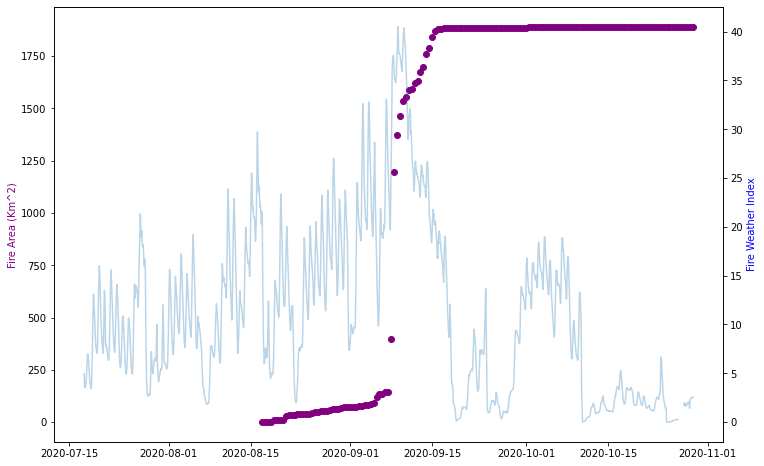

In [135]:
# Plot
fig, ax = plt.subplots(figsize=(12,8))
ax.scatter(full.time, full.farea, color = "purple")
ax.set_ylabel("Fire Area (Km^2)", color = "purple")
ax2=ax.twinx()
ax2.plot(full.time, full["GEOS-5_FWI"], alpha = 0.3)

ax2.set_ylabel("Fire Weather Index",color="blue")

Fire area increases along with a spike in FWI around September 7th. This pattern is reflected across several fires in Oregon and norther California. After September 7th, 5 fires in Oregon grew to over 200 Km^2: The Beachie Creek/ Lionshead, Riverside, Holiday Farm, Archie Creek, and the Slater fire. The spike in FWI was driven by a historic wind event. 

## Forecasting FWI

Metrics like FWI can be useful to try to forecast fire risk. Forecasts of fire risk help communities and decision makers prepare for fires. 


We can compare the predicted FWI values against the values we observed.


In [185]:
# Open up forecasted FWI
FWI_forecast = xr.open_zarr("s3://veda-data-store-staging/EIS/zarr/FWI.GEOS-5.zarr")
FWI_forecast = FWI_forecast.rename({"lat": 'y', "lon": 'x'})
FWI_forecast.rio.write_crs("epsg:4326", inplace=True)

# Clip to the variable, time, and location we are interested in. 
FWI_forecast = FWI_forecast["GEOS-5_FWI"]
FWI_forecast = FWI_forecast.sel(time = slice(month_early, max(fire.time)))
FWI_forecast = FWI_forecast.rio.clip_box(minx = min(lons), miny = min(lats), maxx=max(lons), maxy = max(lats), auto_expand= True)
FWI_forecast = FWI_forecast.mean(dim = ["y", "x"])

In [186]:
# Diagonally shiftting the data for chiclet plot
tmp = np.array([np.roll(np.array(FWI_forecast.sel(forecast=i).values), i) for i in reversed(range(9))])
ys = np.arange(9)
xs = FWI_forecast.time.values
zs = tmp

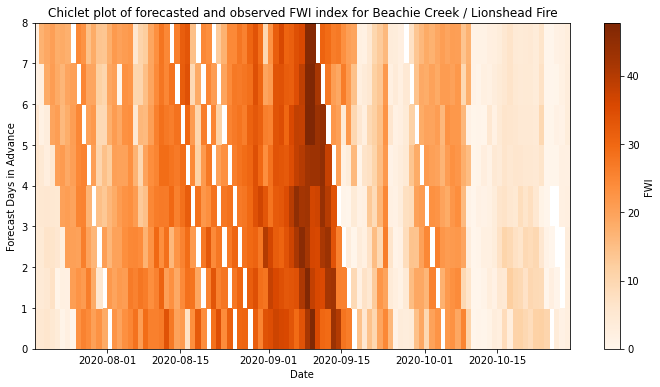

In [189]:
# Display the Plot
plt.figure(figsize=(12,6))
plt.title("Chiclet plot of forecasted and observed FWI index for Beachie Creek / Lionshead Fire")
plt.pcolormesh(xs,ys,tmp, cmap="Oranges")
plt.xlabel("Date")
plt.ylabel("Forecast Days in Advance")
plt.colorbar(label = "FWI")
plt.show()

This plot shows the observed values of FWI in the 0-th row of the y-axis, and forecasted FWI at previos days. This plot shows that forecasted FWI was highest during September 7th, and that the forecast predicted an uptick in FWI about four days in advance of the wind event.

## Take Homes

By investigating the relationship between FWI and fire spread, we can predict periods of high fire-risk, and can use advance warning to mitigate harm. 